# Plotting Whole Brain Seed-Based FC Sanity Checks

This notebook plots output images from each subject generated by a bash script to calculate seed-based whole-brain functional connectivity from an average timeseries from a freesurfer parcellation. This script can be found at <https://github.com/utooley/rs_scripts/tree/master>.

Here, I plot whole brain correlations from visual and motor areas, looking for high correlations with homolog areas.

_Updated April 15th, 2017_

In [3]:
from __future__ import print_function

import sys
import os
import numpy as np
import nibabel as nib
import nilearn as nl

# Image settings
import nilearn.plotting as nlp
import matplotlib as mpl
import pylab as plt
import seaborn as sns
sns.set_style('white')
%matplotlib inline
mpl.rcParams['font.family'] = 'DejaVu Sans'

# Assumed working directory
os.chdir("/data/picsl/mackey_group/Ursula/analyses/")

# Set Up Project Specific Variables

In [4]:
rsfmri_dir = '/data/picsl/mackey_group/Ursula/subjects/'
subj_prefix = 'P'
sublist_dir='/data/picsl/mackey_group/Ursula/scripts/'
#subj_subset = ['P1280', 'P1378', 'P1474'] 
              # set to None to see all subjects
with open(os.path.join(sublist_dir, 'sub_list_Siemens_full_under_10_no_motion.txt')) as sublist:
    subj_subset=sublist.readlines()
    subj_subset=map(str.strip, subj_subset) #use to read list from .txt file
roi_list=['l_occip', 'l_precent', 'r_occip', 'r_precent'] #list of freesurfer ROI abbreviations (user-defined) used as seeds for whole brain seed-based connectivity

## Set up subj list for later use

In [5]:
def get_subjlist():
    if subj_subset == None:
        subjlist = [fl for fl in sorted(os.listdir(rsfmri_dir)) 
                    if fnmatch.fnmatch(fl, subj_prefix)]
    else:    
        subjlist = subj_subset
    return subjlist

# Define Plotting Functions

In [6]:
def plot_wb_connectivity(subj_path, roi, title, fig=None, ax=None):
    epi_corr = os.path.join(subj_path, 'resting', 'roi_betas', roi, 'MNI_beta.nii.gz' )
    close = False
    if ax is None:
        fig = plt.figure(figsize=(5, 2))
        ax = fig.gca()
        close = True
    display = nlp.plot_glass_brain(epi_corr, threshold=1, black_bg=True , annotate=True,
                            draw_cross=False, title=title, figure=fig, axes=ax, cmap=nlp.cm.bwr)
    if close:
        plt.show()
        display.close()

# Plot Whole Brain Correlations with Each ROI's Timeseries

/home/utooley/miniconda2/lib/python2.7/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/home/utooley/miniconda2/lib/python2.7/site-packages/nilearn/plotting/glass_brain.py:164: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  black_bg = colors.colorConverter.to_rgba(ax.get_axis_bgcolor()) \


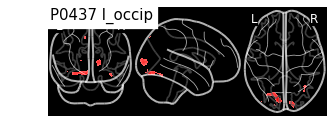

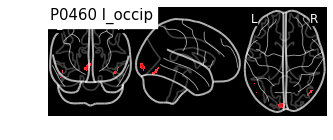

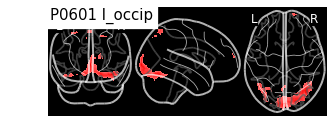

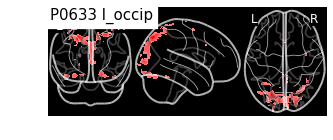

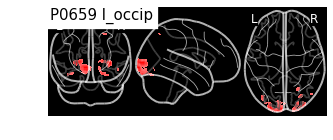

...

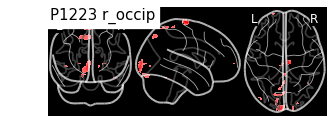

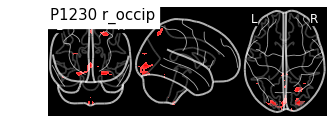

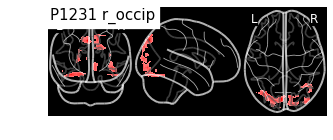

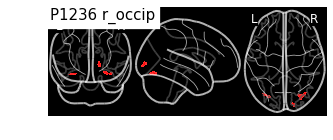

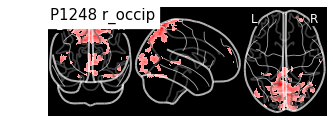

KeyboardInterrupt: 

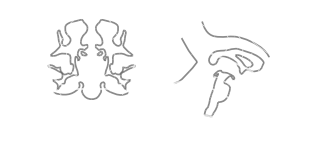

In [7]:
subjlist = get_subjlist()
for roi in roi_list:
    for subj in subjlist:
        plot_wb_connectivity(os.path.join(rsfmri_dir,subj), roi, title=subj+" "+roi)

## For Plotting Motor Correlations, Use Different Function

In [6]:
def plot_epi_connectivity(subj_path, roi, title, fig=None, ax=None):
    epi_corr = os.path.join(subj_path, 'resting', 'roi_betas', roi, 'MNI_beta.nii.gz' )
    close = False
    if ax is None:
        fig = plt.figure(figsize=(5, 2))
        ax = fig.gca()
        close = True
    display = nlp.plot_epi(epi_corr, black_bg=False, cut_coords=(0,-13,45), annotate=True,
                         title=title, figure=fig, draw_cross=True, axes=ax, vmax=2.5)
    if close:
        plt.show()
        display.close()

/home/utooley/miniconda2/lib/python2.7/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


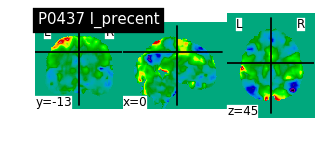

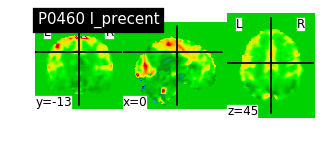

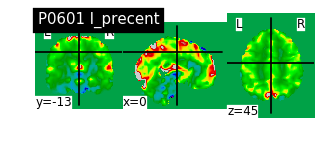

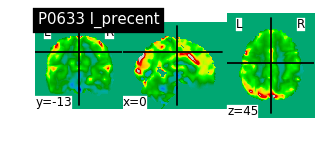

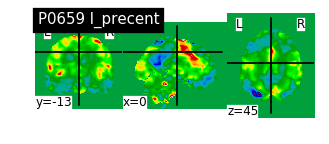

...

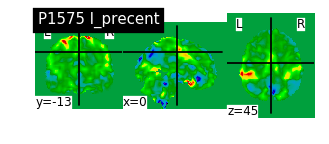

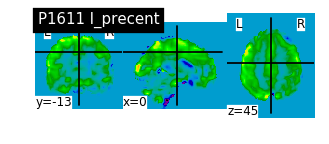

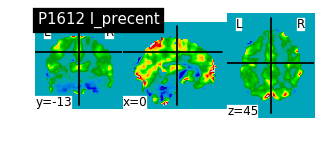

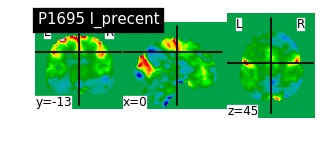

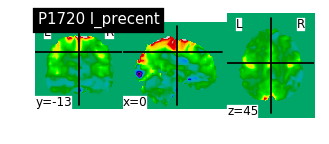

In [7]:
subjlist = get_subjlist()
for subj in subjlist:
    plot_epi_connectivity(os.path.join(rsfmri_dir,subj), 'l_precent', title=subj+" l_precent")